In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Colab Notebooks/Data/tweet_picture.zip'

Archive:  /content/drive/MyDrive/Colab Notebooks/Data/tweet_picture.zip
   creating: tweet_picture/
   creating: tweet_picture/landslide/
  inflating: tweet_picture/landslide/1.png  
  inflating: tweet_picture/landslide/10.png  
  inflating: tweet_picture/landslide/100.png  
  inflating: tweet_picture/landslide/101.png  
  inflating: tweet_picture/landslide/1010.png  
  inflating: tweet_picture/landslide/1034.png  
  inflating: tweet_picture/landslide/1035.png  
  inflating: tweet_picture/landslide/1036.png  
  inflating: tweet_picture/landslide/1037.png  
  inflating: tweet_picture/landslide/1038.png  
  inflating: tweet_picture/landslide/1040.png  
  inflating: tweet_picture/landslide/1041.png  
  inflating: tweet_picture/landslide/1042.png  
  inflating: tweet_picture/landslide/1043.png  
  inflating: tweet_picture/landslide/1045.png  
  inflating: tweet_picture/landslide/1064.png  
  inflating: tweet_picture/landslide/1080.png  
  inflating: tweet_picture/landslide/1100.png  
  inf

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import tqdm
import os
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [ ]:
input_path=[]
label=[]
for class_name in os.listdir('tweet_picture'):
    for path in os.listdir('tweet_picture/'+class_name):
        if class_name=='landslide':
            label.append(1)
        else:
            label.append(0)
        input_path.append(os.path.join("tweet_picture",class_name,path))

print(input_path[656],label[656])

tweet_picture/other/862.png 0


In [ ]:
len(input_path)

2425

In [ ]:
len(label)

2425

In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,tweet_picture/other/2328.png,0
1,tweet_picture/other/1039.png,0
2,tweet_picture/landslide/155.png,1
3,tweet_picture/other/668.png,0
4,tweet_picture/other/1017.png,0


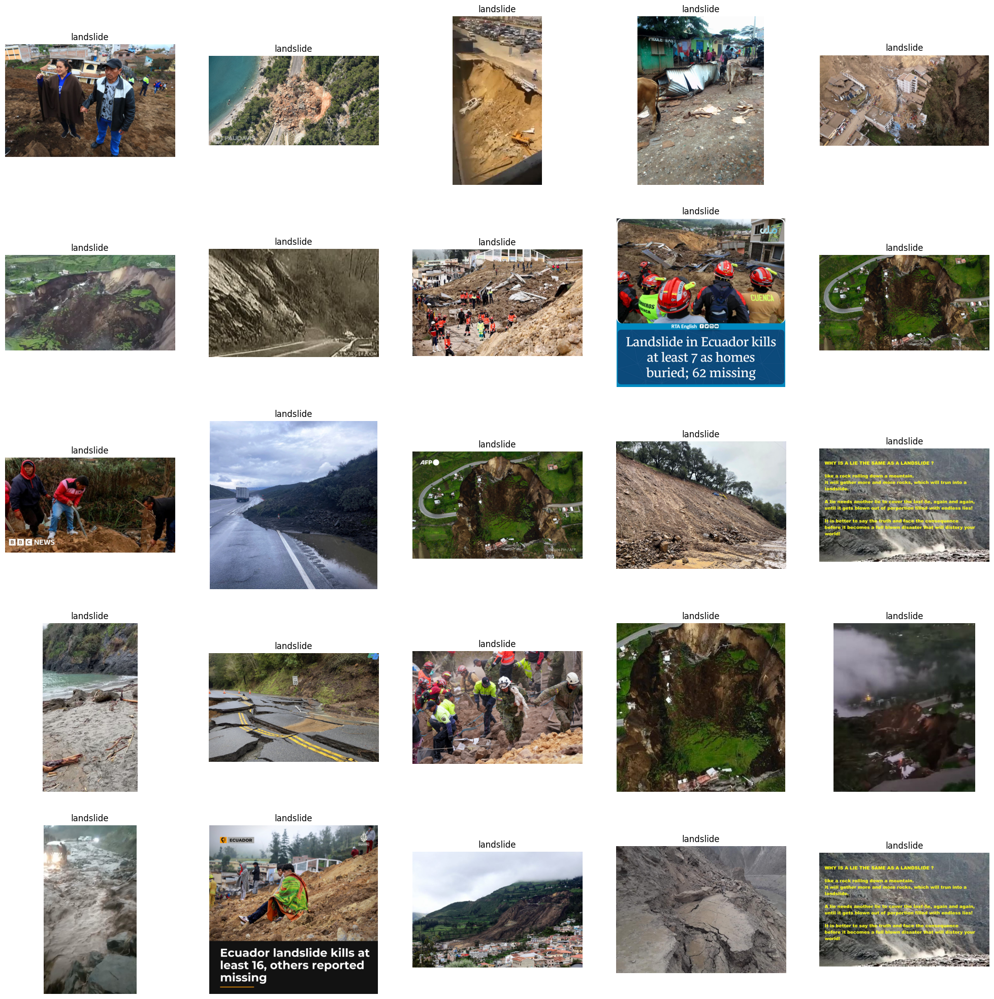

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('landslide')
    plt.axis('off')

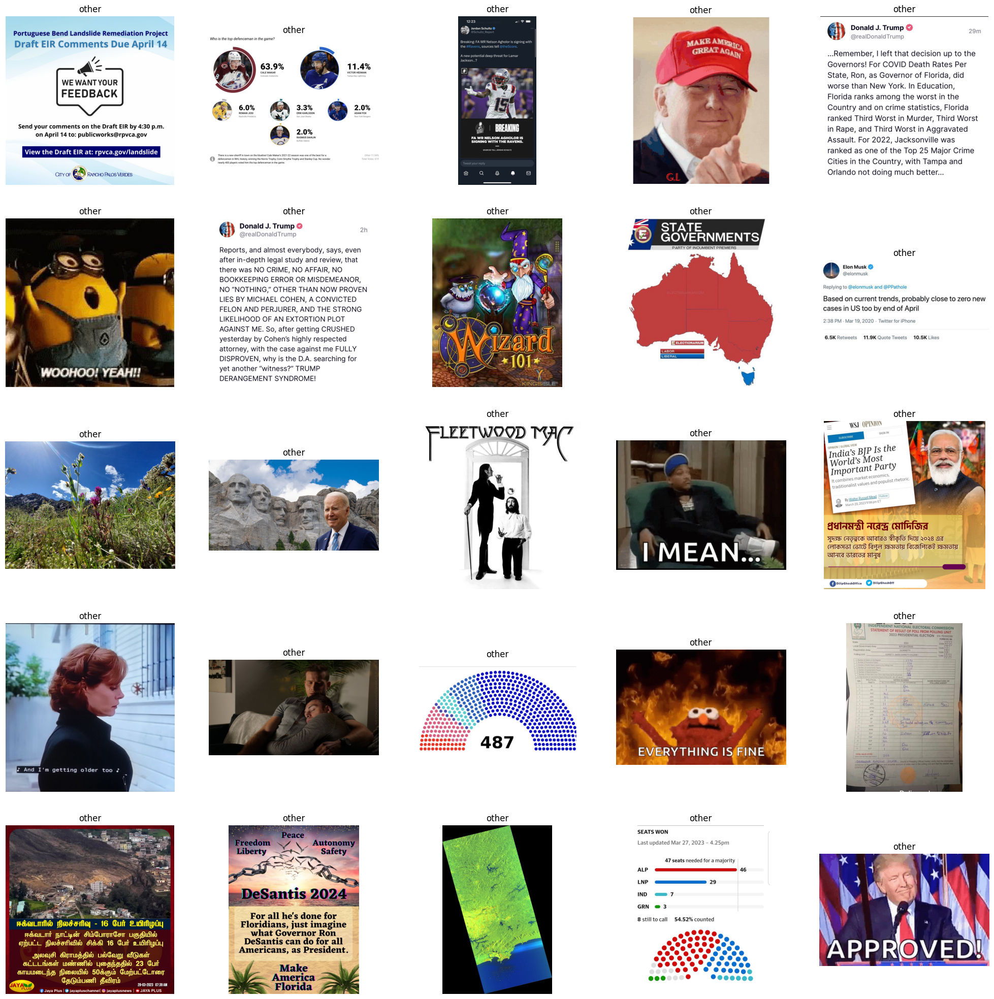

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('other')
    plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

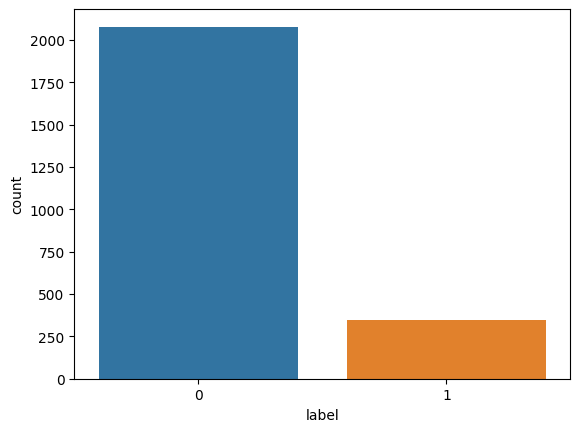

In [ ]:
import seaborn as sns
sns.countplot(x=df["label"])

In [ ]:
df['label'] = df['label'].astype('str')

In [ ]:
df.head()

,images,label
0,tweet_picture/other/2328.png,0
1,tweet_picture/other/1039.png,0
2,tweet_picture/landslide/155.png,1
3,tweet_picture/other/668.png,0
4,tweet_picture/other/1017.png,0


In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
train.head()

,images,label
2200,tweet_picture/other/2101.png,0
1844,tweet_picture/other/2163.png,0
1852,tweet_picture/other/1504.png,0
2345,tweet_picture/other/1592.png,0
2004,tweet_picture/other/1446.png,0


In [ ]:
test.head()

,images,label
1490,tweet_picture/other/942.png,0
387,tweet_picture/other/2410.png,0
1419,tweet_picture/other/1858.png,0
410,tweet_picture/other/974.png,0
482,tweet_picture/other/1464.png,0


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test, 
    x_col='images', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=128, 
    class_mode='binary'
)

Found 1940 validated image filenames belonging to 2 classes.
Found 485 validated image filenames belonging to 2 classes.


In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
                    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
                    MaxPool2D((2,2)),
                    Conv2D(32, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Conv2D(64, (3,3), activation='relu'),
                    MaxPool2D((2,2)),
                    Flatten(),
                    Dense(512, activation='relu'),
                    Dense(1, activation='sigmoid')
])

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [ ]:
history = model.fit(train_iterator, epochs=75, validation_data=val_iterator)

Epoch 1/75
4/4 [==============================] - 50s 9s/step - loss: 0.8528 - accuracy: 0.8407 - val_loss: 0.4584 - val_accuracy: 0.8515
Epoch 2/75
4/4 [==============================] - 40s 11s/step - loss: 0.4112 - accuracy: 0.8577 - val_loss: 0.4075 - val_accuracy: 0.8515
Epoch 3/75
4/4 [==============================] - 43s 12s/step - loss: 0.3896 - accuracy: 0.8577 - val_loss: 0.3961 - val_accuracy: 0.8515
Epoch 4/75
4/4 [==============================] - 40s 11s/step - loss: 0.3557 - accuracy: 0.8577 - val_loss: 0.3480 - val_accuracy: 0.8515
Epoch 5/75
4/4 [==============================] - 43s 12s/step - loss: 0.3396 - accuracy: 0.8577 - val_loss: 0.3408 - val_accuracy: 0.8515
Epoch 6/75
4/4 [==============================] - 40s 11s/step - loss: 0.3221 - accuracy: 0.8577 - val_loss: 0.3302 - val_accuracy: 0.8515
Epoch 7/75
4/4 [==============================] - 43s 12s/step - loss: 0.3089 - accuracy: 0.8577 - val_loss: 0.3114 - val_accuracy: 0.8515
Epoch 8/75
4/4 [============

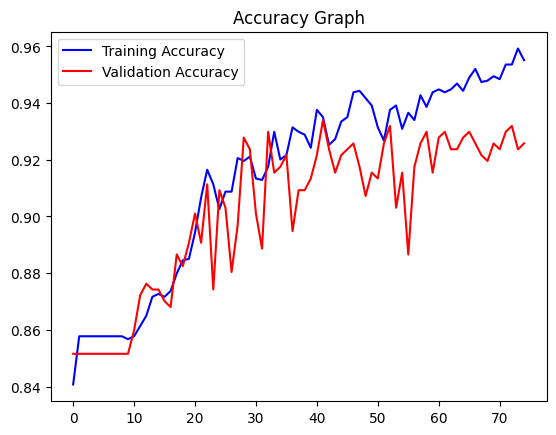

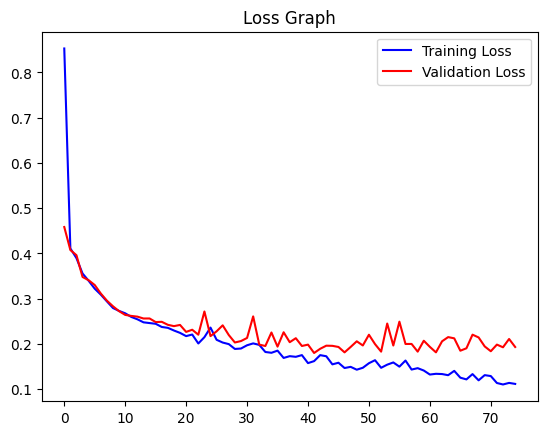

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/Colab Notebooks/Model/landslide_predict_model_75.h5')

In [ ]:
from keras.models import load_model
new_model=load_model('/content/drive/MyDrive/Colab Notebooks/Model/landslide_predict_model_75.h5')

1/1 [==============================] - 0s 18ms/step
[[0.4068099]]
other


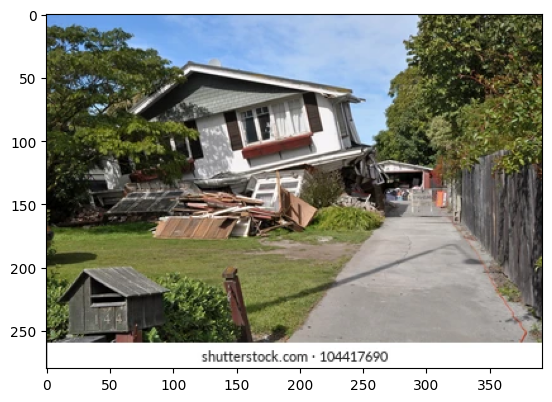

In [ ]:
image_path = "/content/drive/MyDrive/Colab Notebooks/New/test7.jpg" 
imge=plt.imread(image_path)
plt.imshow(imge)
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 
img = img.reshape(1, 128, 128, 3) 
pred = new_model.predict(img)
print(pred)
if pred[0] > 0.5:
    label = 'landslide'
else:
    label = 'other'
print(label)

1/1 [==============================] - 0s 27ms/step
[[0.00010467]]
other


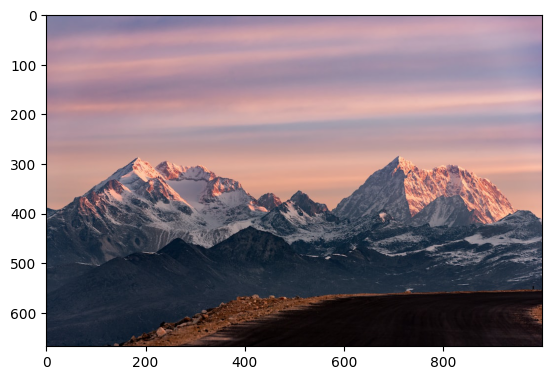

In [ ]:
image_path = "/content/drive/MyDrive/Colab Notebooks/New/test10.jpg" 
imge=plt.imread(image_path)
plt.imshow(imge)
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 
img = img.reshape(1, 128, 128, 3) 
pred = new_model.predict(img)
print(pred)
if pred[0] > 0.5:
    label = 'landslide'
else:
    label = 'other'
print(label)